## Load libraries


In [20]:
%matplotlib ipympl

import mne
import autoreject
from autoreject import AutoReject
from autoreject import get_rejection_threshold
from mne.preprocessing import ICA
import toml
import mne_bids
import re
from pathlib import Path
import numpy as np
mne.viz.set_browser_backend("qt")

config = toml.load("../../.env.toml")
project_path = config["project"]["path"]

## Browse data


In [17]:
fname_path = "/Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff"

raw = mne.io.read_raw_egi(fname_path, preload=True)
raw.set_montage("GSN-HydroCel-257", match_alias={"VREF": "Cz"})

raw_downsampled = raw.crop(tmin=0, tmax=300, include_tmax=True).resample(sfreq=128)

filter_params = {
    "l_freq": 0.5,
    "h_freq": 45,
    "h_trans_bandwidth": 5,
    "fir_design": "firwin2",
    "phase": "zero-double",
}
raw_filtered = raw_downsampled.filter(**filter_params)  # removedrifts
raw_filtered.info["bads"].append("VREF")  # add a single channel

# raw.info["line_freq"] = 50.0
# freqs = 50
# eeg_picks = mne.pick_types(raw.info, eeg=True)
# raw_filtered.notch_filter(freqs=freqs, picks=eeg_picks)
# raw_filtered.plot_sensors(show_names=True)

_ = mne.viz.plot_raw(raw_filtered, duration=20.0)
# raw.drop_channels("VREF", on_missing="raise")

Reading EGI MFF Header from /Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff...
    Reading events ...
    Assembling measurement info ...
Reading 0 ... 300397  =      0.000 ...   300.397 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hamming window
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 5.00 Hz (-12 dB cutoff frequency: 47.50 Hz)
- Filter length: 1690 samples (13.203 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.2s


Using pyopengl with version 3.1.6


Channels marked as bad:
['VREF']


Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 100 events and 385 original time points ...
1 bad epochs dropped
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 100 events and 384 original time points ...
0 bad epochs dropped
No projector specified for this dataset. Please consider the method self.add_proj.


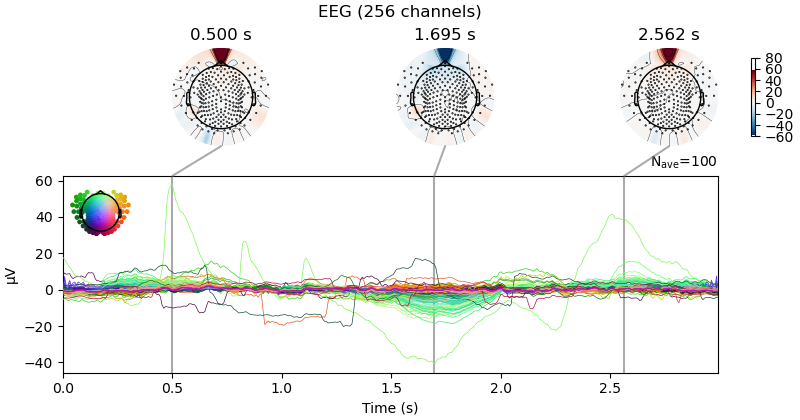

Effective window size : 3.000 (s)
Averaging across epochs...


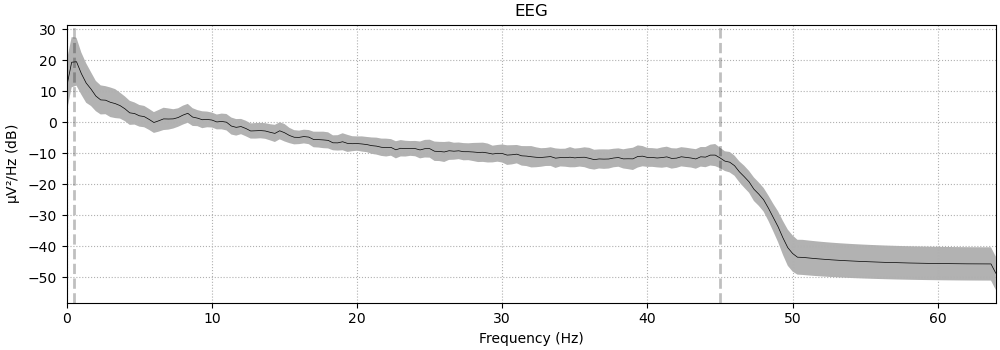

In [4]:
events = mne.make_fixed_length_events(
    raw=raw_filtered, start=0, stop=None, duration=3, overlap=0, first_samp=False
)

# Create  Epochs object
epochs = mne.Epochs(
    raw=raw_filtered,
    events=events,
    tmin=0,
    tmax=3,
    detrend=0,
    baseline=None,
    preload=True,
)

epochs = mne.make_fixed_length_epochs(raw_filtered, duration=3, preload=True)
# plot the data
epochs.average().detrend().plot_joint()
psd_plot = epochs.compute_psd(method="welch", picks="eeg", exclude="bads").plot(
    average=True, picks="eeg", exclude="bads", show=False
)

In [6]:
ar = autoreject.AutoReject(
    n_interpolate=[1, 2, 4, 8, 16, 32], random_state=11, n_jobs=-1, verbose=True
)
ar.fit(epochs[:20])  # fit on a few epochs to save time
epochs_ar, reject_log = ar.transform(epochs, return_log=True)

Running autoreject on ch_type=eeg


/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 1 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Creating augmented epochs : 0/256 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/256 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/6 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=1


/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 1 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

Dropped 13 epochs: 0, 43, 44, 45, 46, 47, 56, 73, 86, 88, 97, 98, 99


No projector specified for this dataset. Please consider the method self.add_proj.


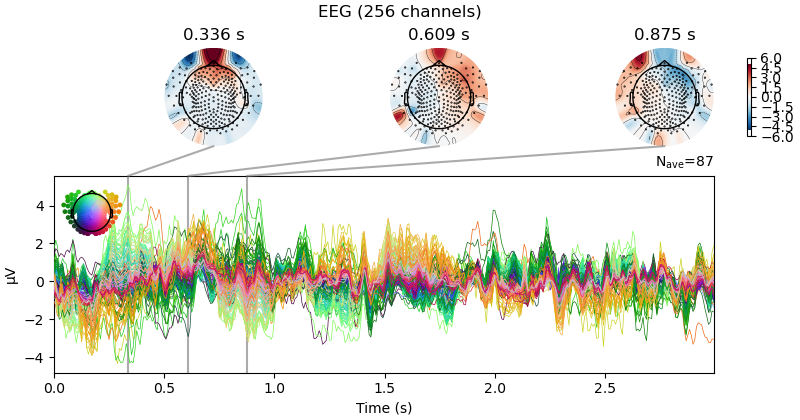

Effective window size : 3.000 (s)
Averaging across epochs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


Number of events,87
Events,1: 87
Time range,0.000 – 2.992 s
Baseline,off


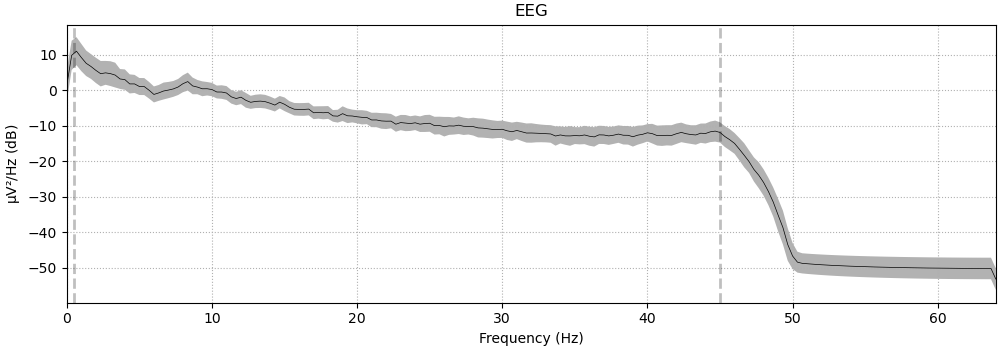

In [7]:
epochs_ar.average().detrend().plot_joint()
_ = epochs_ar.compute_psd(method="welch", picks="eeg", exclude="bads").plot(
    average=True, picks="eeg", exclude="bads", show=False
)

epochs_ar.set_eeg_reference("average")

Using pyopengl with version 3.1.6


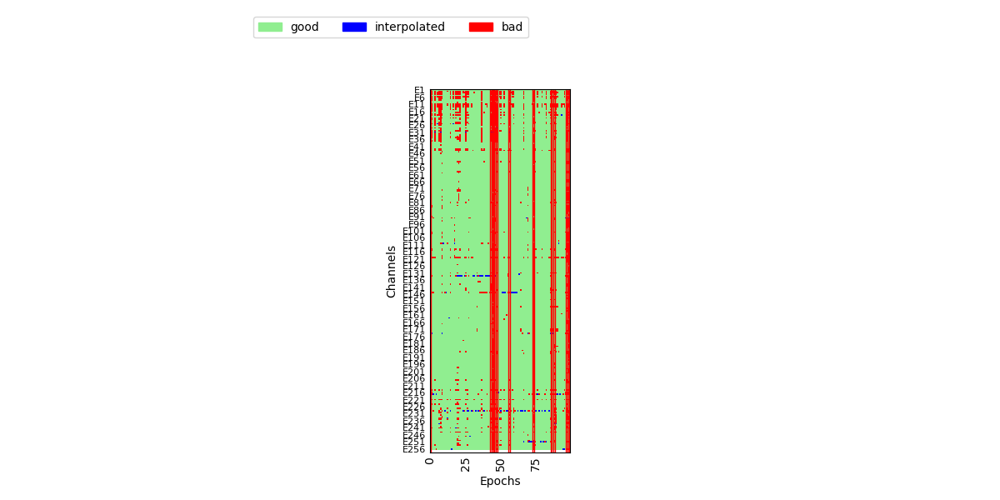

In [8]:
epochs[reject_log.bad_epochs].plot(scalings=dict(eeg=100e-6))
_ = reject_log.plot("horizontal", show=False)

# ICA


## First ICA


In [9]:
# compute ICA

ica = mne.preprocessing.ICA(random_state=99, n_components=100, method="picard")
ica.fit(epochs[~reject_log.bad_epochs])

Fitting ICA to data using 256 channels (please be patient, this may take a while)
Selecting by number: 100 components
Fitting ICA took 5.7s.


Method,picard
Fit parameters,max_iter=500
Fit,106 iterations on epochs (33408 samples)
ICA components,100
Available PCA components,256
Channel types,eeg
ICA components marked for exclusion,—


In [25]:
ica.plot_sources(epochs[~reject_log.bad_epochs], show_scrollbars=False)

Not setting metadata
87 matching events found
No baseline correction applied
0 projection items activated
Using pyopengl with version 3.1.6


In [27]:
# "ICA012", "ICA015", "ICA018", "ICA017" "ICA067"
ica.exclude = [12, 15, 17, 18, 67]
epoch_clean = ica.apply(epochs, exclude=ica.exclude)

Applying ICA to Epochs instance
    Transforming to ICA space (100 components)
    Zeroing out 5 ICA components
    Projecting back using 256 PCA components


## Second time autorejct


In [33]:
# compute channel-level rejections
ar = autoreject.AutoReject(
    n_interpolate=[1, 2, 4, 8, 32, 64], random_state=11, n_jobs=-1, verbose=True
)
ar.fit(epochs_clean[:40])  # fit on the first 20 epochs to save time
epochs_clean_ar, reject_clean_log = ar.transform(epochs_clean, return_log=True)
epochs_clean[reject_clean_log.bad_epochs].plot(scalings=dict(eeg=100e-6))

Running autoreject on ch_type=eeg


/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 1 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Creating augmented epochs : 0/256 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/256 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/6 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=1


/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 1 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Repairing epochs : 0/89 [00:00<?,       ?it/s]

Dropped 8 epochs: 6, 7, 20, 35, 50, 78, 79, 81
Using pyopengl with version 3.1.6


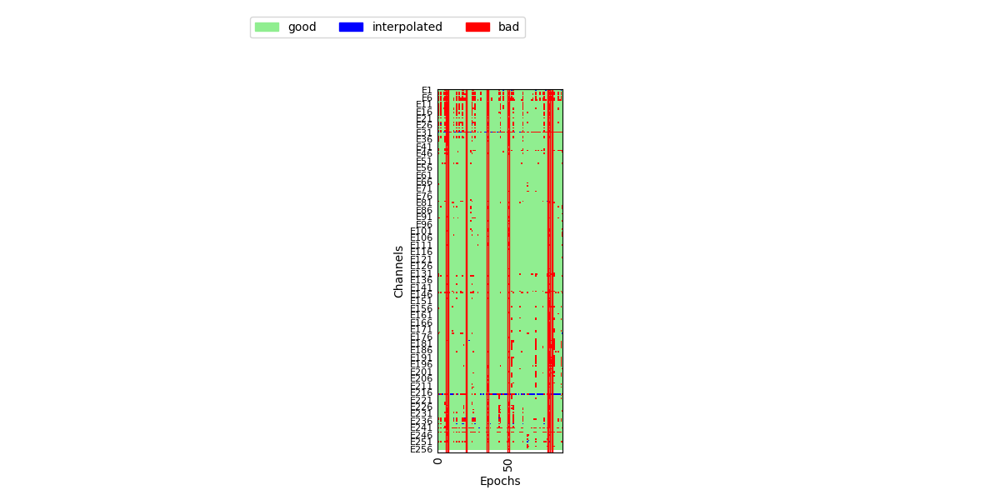

In [34]:
_ = reject_clean_log.plot("horizontal", show=False)

In [35]:
ica = mne.preprocessing.ICA(random_state=99, n_components=100, method="picard")
ica.fit(epochs_clean[~reject_clean_log.bad_epochs])
ica.plot_sources(epochs_clean[~reject_clean_log.bad_epochs], show_scrollbars=False)

Fitting ICA to data using 256 channels (please be patient, this may take a while)
Selecting by number: 100 components
Fitting ICA took 7.5s.
Not setting metadata
81 matching events found
No baseline correction applied
0 projection items activated
Using pyopengl with version 3.1.6


In [40]:
ica.exclude = [0, 6, 8, 86]
epochs_clean_clean = ica.apply(epochs_clean, exclude=ica.exclude)

Applying ICA to Epochs instance


    Transforming to ICA space (100 components)
    Zeroing out 4 ICA components
    Projecting back using 256 PCA components


In [41]:
# compute channel-level rejections
ar = autoreject.AutoReject(
    n_interpolate=[1, 2, 4, 8, 32, 64], random_state=11, n_jobs=-1, verbose=True
)
ar.fit(epochs_clean_clean[:40])  # fit on the first 20 epochs to save time
epochs_clean_clean_ar, reject_clean_clean_log = ar.transform(
    epochs_clean, return_log=True
)
epochs_clean_clean[reject_clean_clean_log.bad_epochs].plot(
    scalings=dict(eeg=100e-6))

Running autoreject on ch_type=eeg


/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 1 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Creating augmented epochs : 0/256 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/256 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/6 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/40 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.20 and n_interpolate=1


  0%|          | Repairing epochs : 0/89 [00:00<?,       ?it/s]

Dropped 6 epochs: 7, 50, 69, 78, 79, 81
Using pyopengl with version 3.1.6


No projector specified for this dataset. Please consider the method self.add_proj.


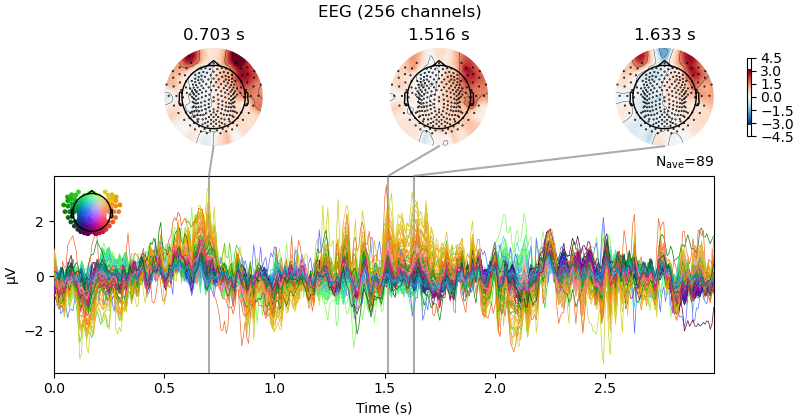

Effective window size : 3.000 (s)
Averaging across epochs...


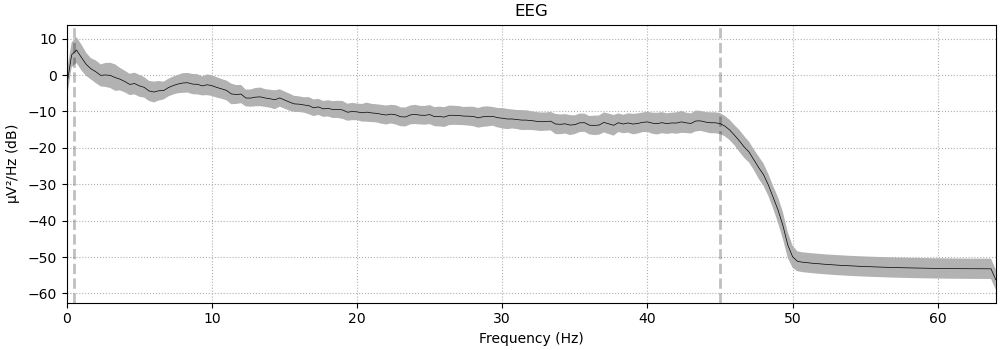

In [44]:
epochs_clean_clean.drop_bad()
epochs_clean_clean.average().detrend().plot_joint()
_ = epochs_clean_clean.compute_psd(method="welch", picks="eeg", exclude="bads").plot(
    average=True, picks="eeg", exclude="bads", show=False
)

# epochs_ar.set_eeg_reference("average")

Effective window size : 3.000 (s)


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_7182/928083602.py:5: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOFGroup


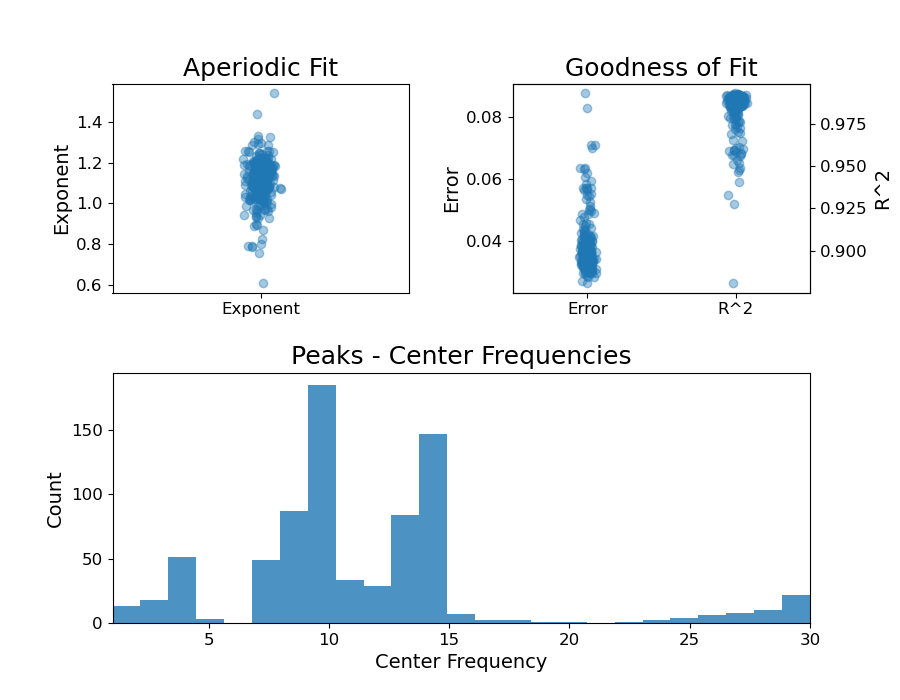

In [45]:
from fooof.plts.spectra import plot_spectra
from fooof.analysis import get_band_peak_fg
from fooof.bands import Bands
from fooof import FOOOFGroup

psd = epochs_clean_clean.compute_psd(method="welch").average()
spectra, freqs = psd.get_data(return_freqs=True)
# Initialize a FOOOFGroup object, with desired settings

fg = FOOOFGroup(
    peak_width_limits=[1, 6],
    min_peak_height=0.15,
    peak_threshold=2.0,
    max_n_peaks=6,
    verbose=False,
)

# Define the frequency range to fit
freq_range = [1, 30]
fg.fit(freqs, spectra, freq_range)
fg.plot()

ValueError: Number of channels in the Info object (257) and the data array (256) do not match. Pick Info with e.g. mne.pick_info and mne.channel_indices_by_type.

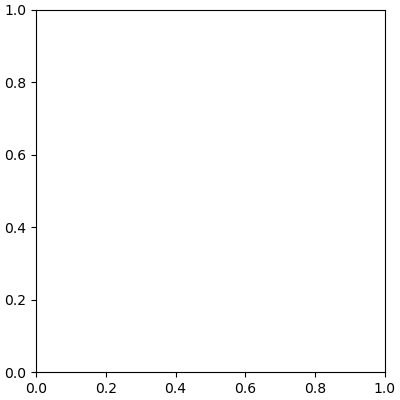

In [46]:
# Define frequency bands of interest
from matplotlib import cm, colors, colorbar

bands = Bands({"theta": [3, 7], "alpha": [7, 14], "beta": [15, 30]})

# Extract alpha peaks
alphas = get_band_peak_fg(fg, bands.alpha)

# Extract the power values from the detected peaks
alpha_pw = alphas[:, 1]

# Plot the topography of alpha power

mne.viz.plot_topomap(alpha_pw, raw.info, cmap=cm.viridis, contours=0, size=4)

In [24]:
# Exclude blink artifact components (use Fp1 as EOG proxy)
epochs_eog = mne.preprocessing.create_eog_epochs(raw=raw_filtered, ch_name="E31")

# mne.preprocessing.find_ecg_events(event_id=999)
_, eog_scores = ica.find_bads_eog(epochs_eog, ch_name="E31", measure="zscore")
ica.exclude = np.argwhere(abs(eog_scores) > 0.5).ravel().tolist()

# Apply ICA
epochs_clean = ica.apply(epochs.copy())

# Autoreject (local) on blink-artifact-free epochs
auto_reject_post_ica = AutoReject(random_state=100).fit(epochs_clean[:20])
epochs_clean = auto_reject_post_ica.transform(epochs_clean)

Using EOG channel: E31
EOG channel index for this subject is: [30]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel E31 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 5 significant peaks
Number of EOG events detected: 5
Not setting metadata
5 matching events found
No baseline correction applied
Using data from preloaded Raw for 5 events and 129 original time points ...
0 bad epochs dropped
Using EOG channel: E31
Applying ICA t

/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 1 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Creating augmented epochs : 0/256 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/256 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/20 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.40 and n_interpolate=1


/Users/daniel/.pyenv/versions/spectral-3.11/lib/python3.11/site-packages/autoreject/utils.py:73: UserWarning: 1 channels are marked as bad. These will be ignored. If you want them to be considered by autoreject please remove them from epochs.info["bads"].
  warnings.warn(


  0%|          | Repairing epochs : 0/100 [00:00<?,       ?it/s]

Dropped 11 epochs: 0, 43, 44, 45, 46, 47, 73, 88, 97, 98, 99


In [ ]:
epochs_ar.average().detrend().plot_joint()
_ = epochs_ar.compute_psd(method="welch", picks="eeg", exclude="bads").plot(
    average=True, picks="eeg", exclude="bads", show=False
)

epochs_ar.set_eeg_reference("average")

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
13 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
13 matching events found
No baseline correction applied
0 projection items activated
Using pyopengl with version 3.1.6


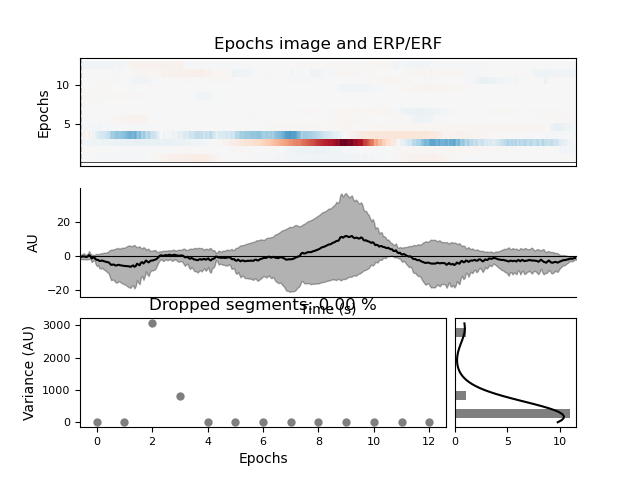

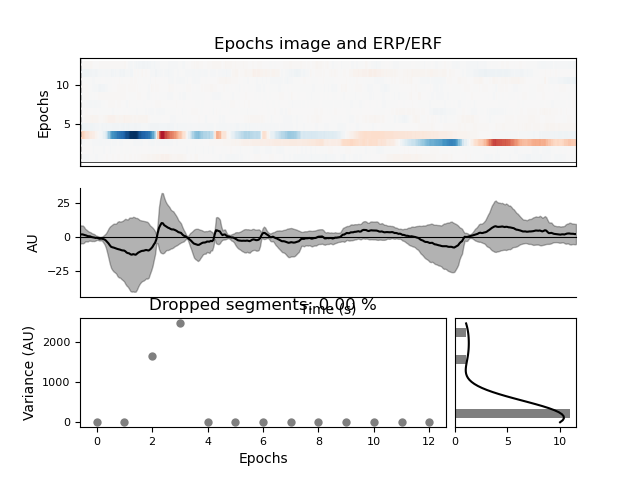

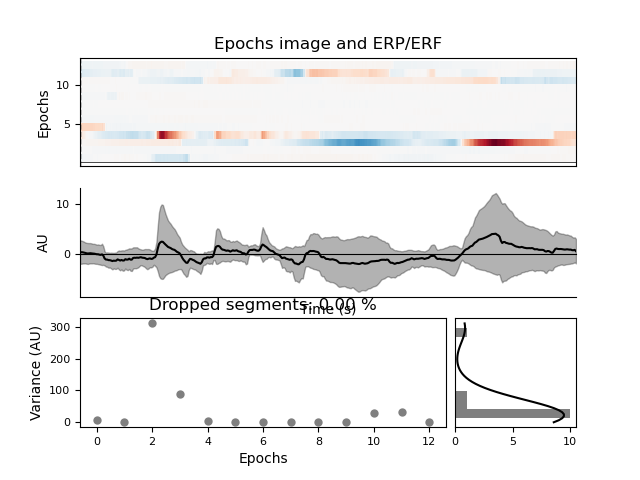

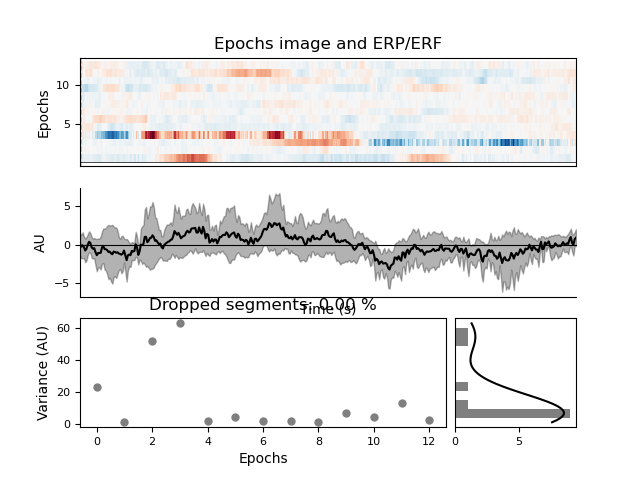

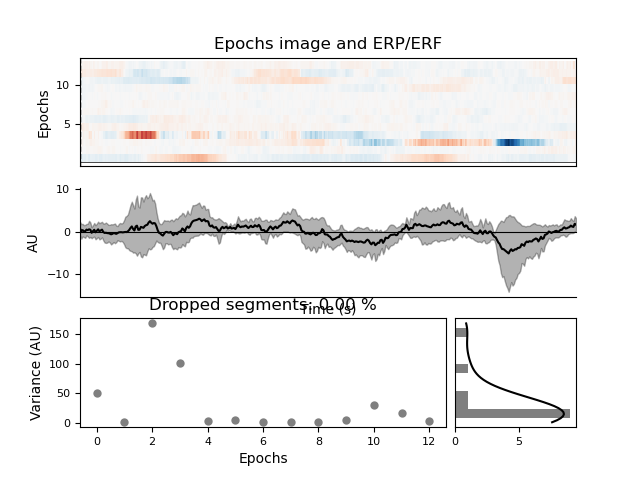

...

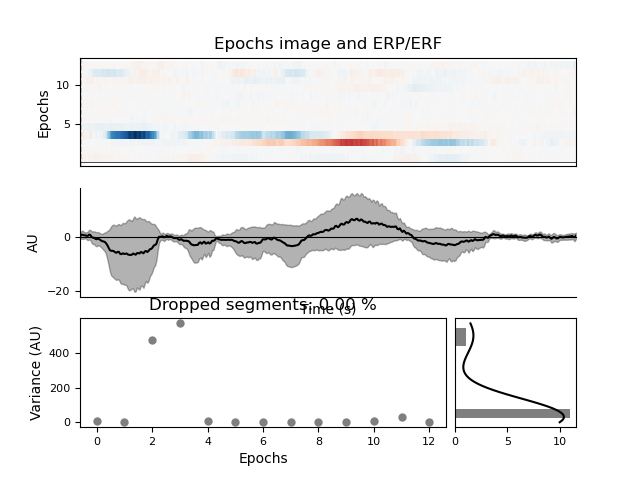

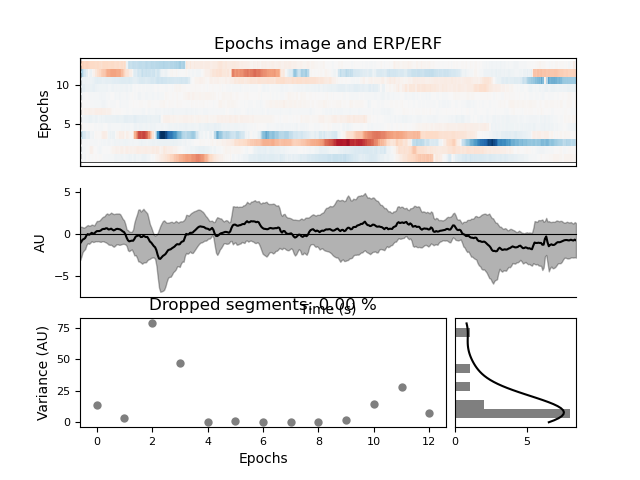

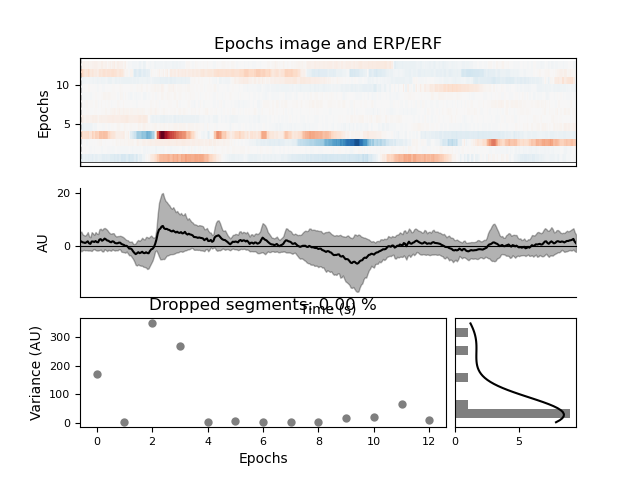

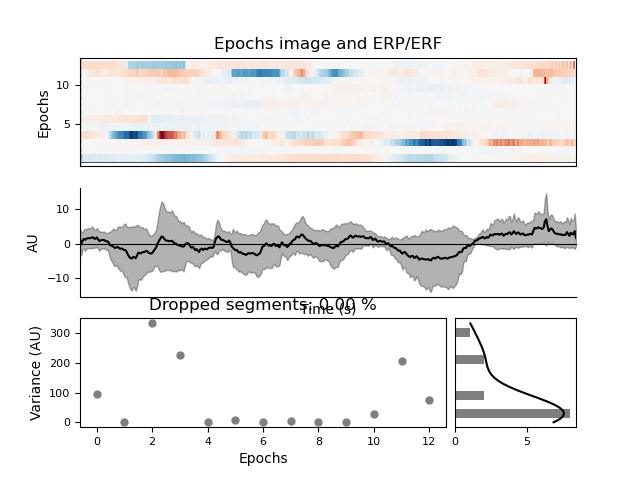

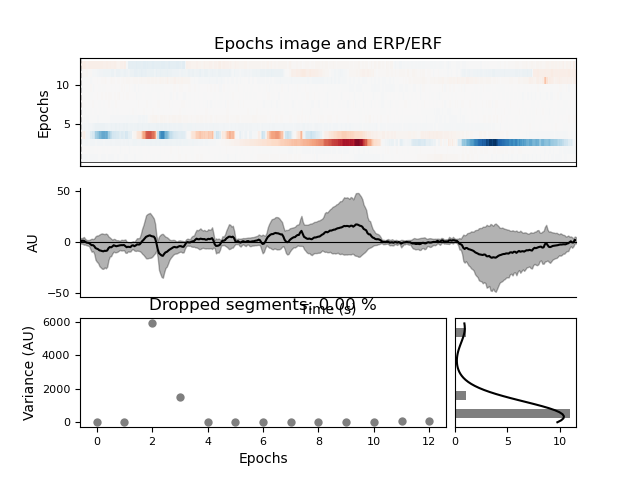

In [11]:
from mne_icalabel.gui import label_ica_components

gui = label_ica_components(epochs[reject_log.bad_epochs], ica)

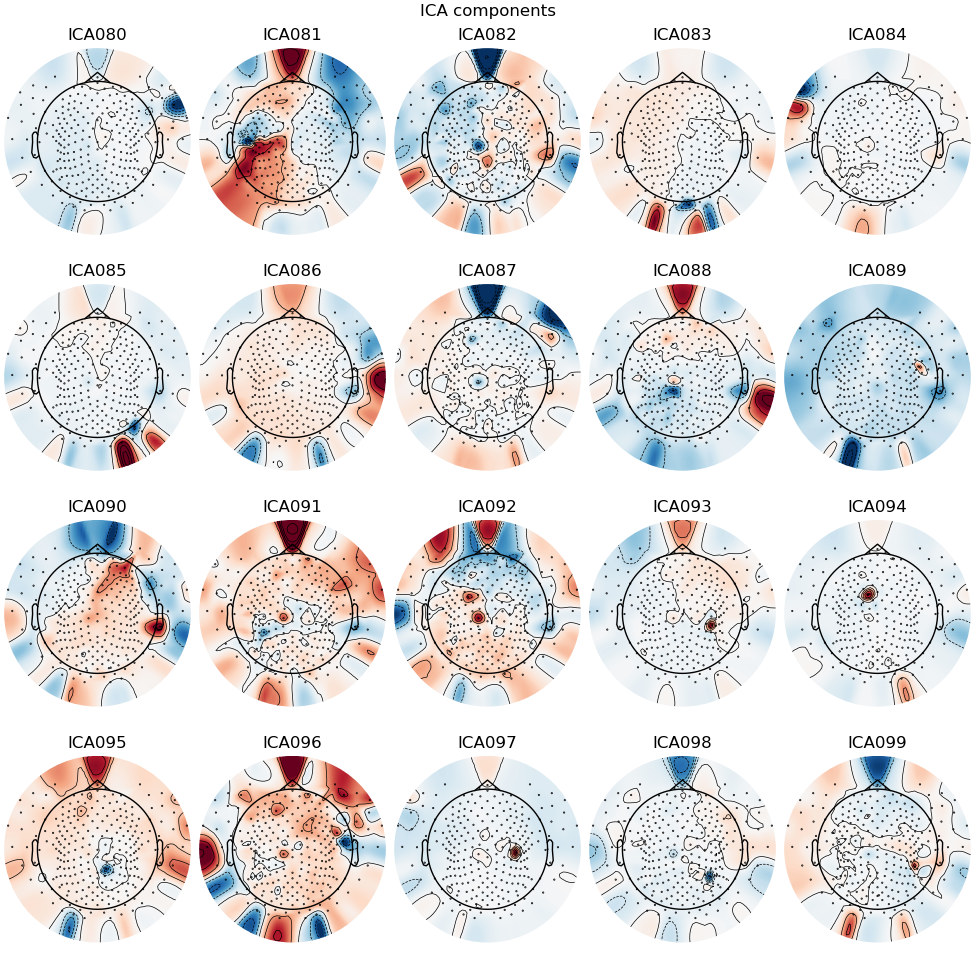

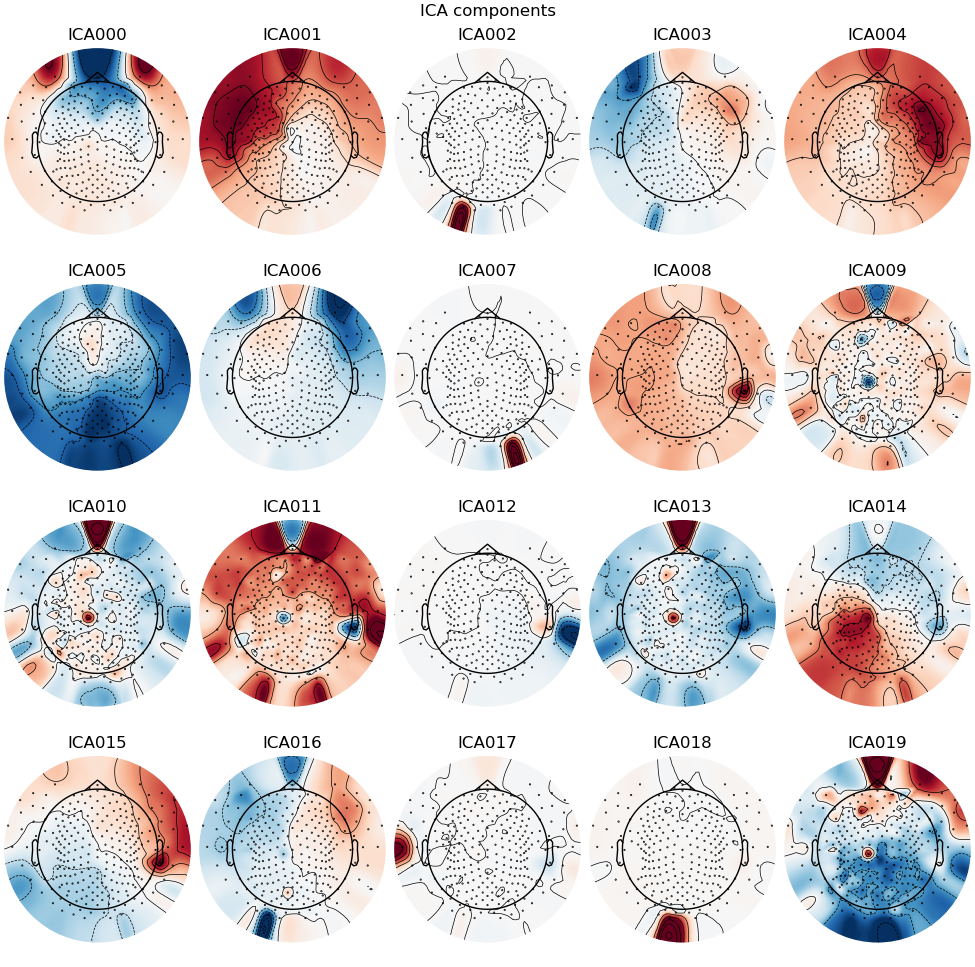

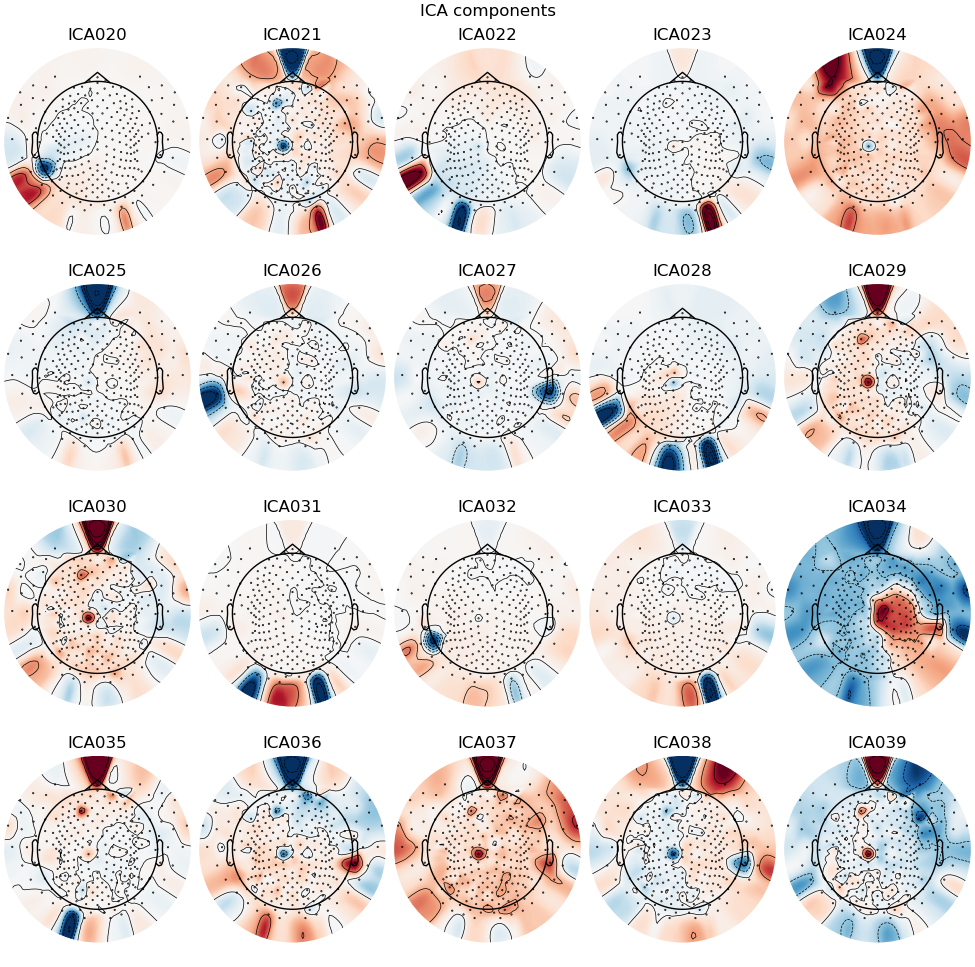

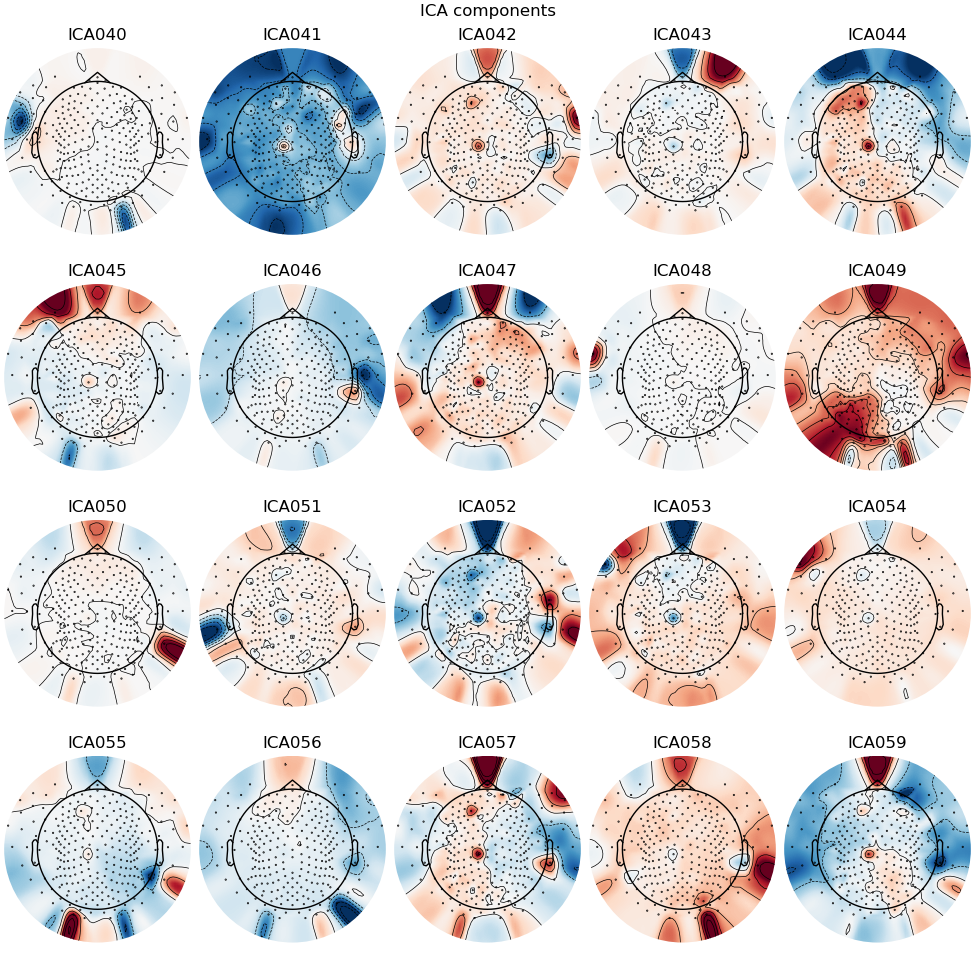

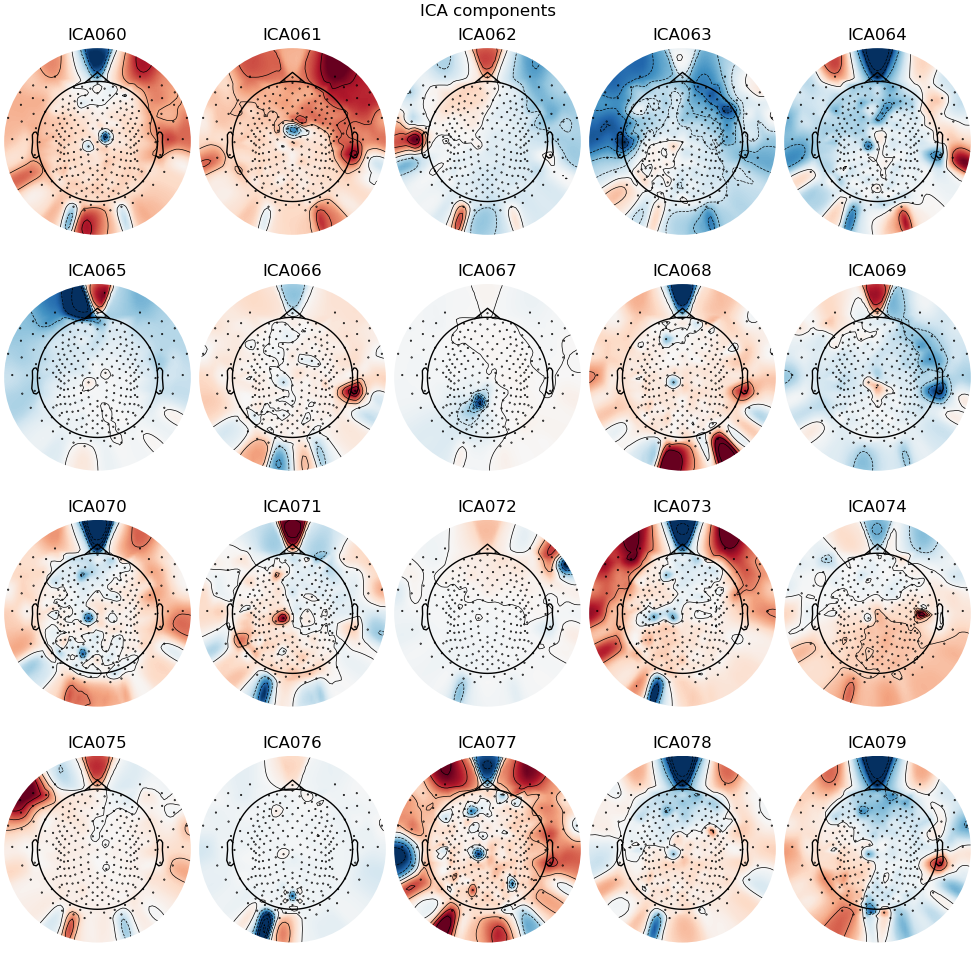

In [11]:
# Plot ICA components for inspection
_ = ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
87 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
87 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
87 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
87 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
87 matching events found
No baseline correction applied
0 projection items activated


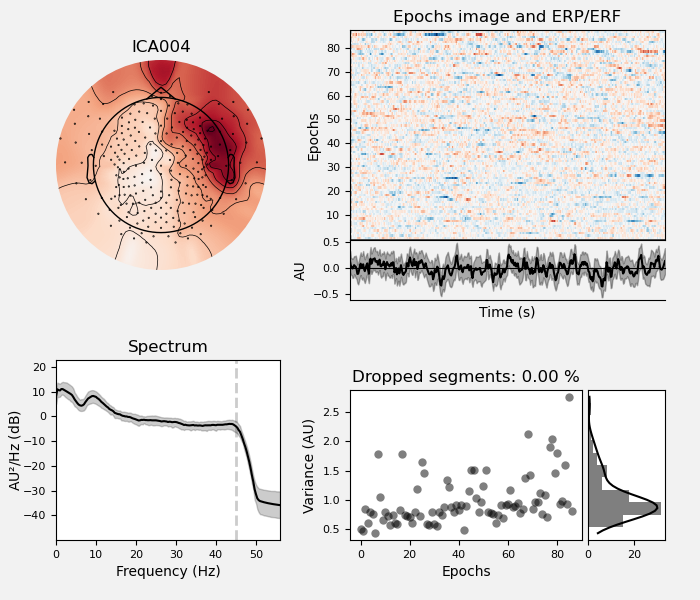

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

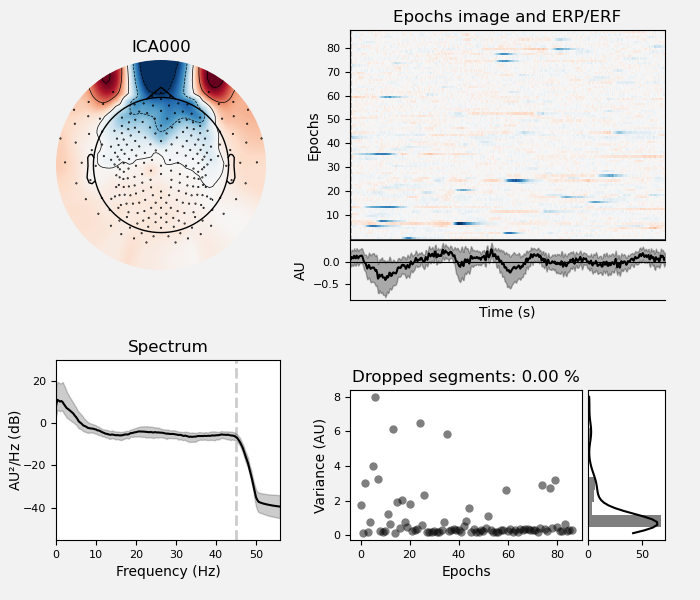

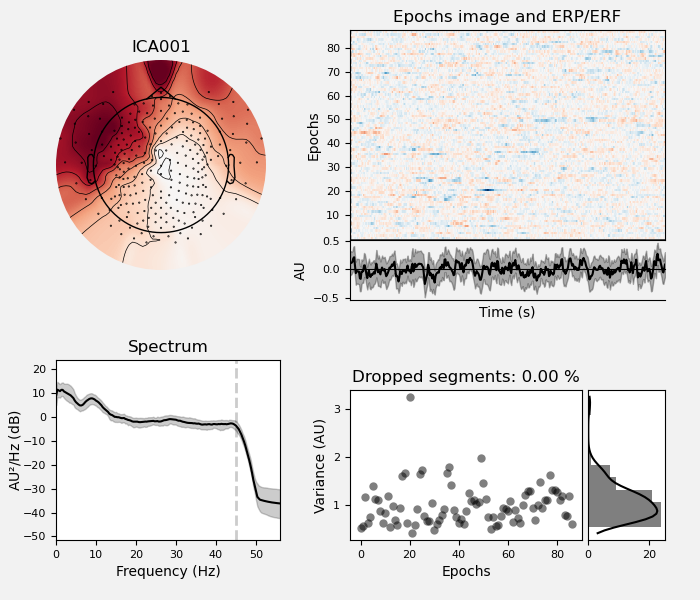

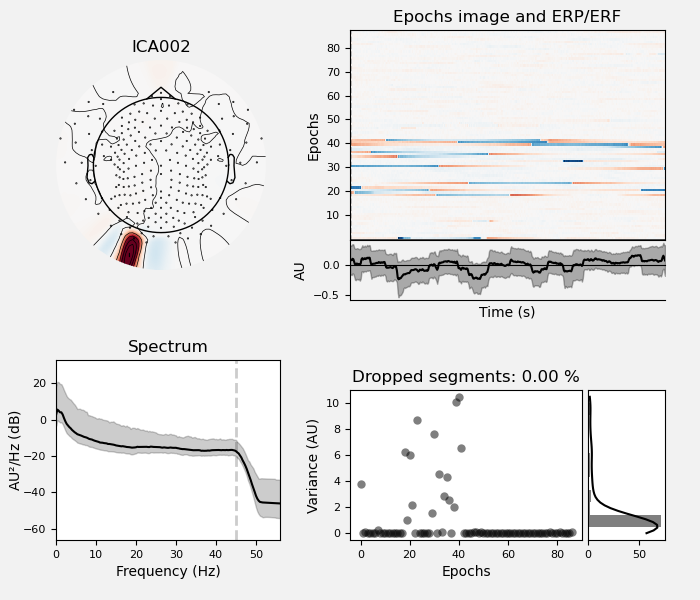

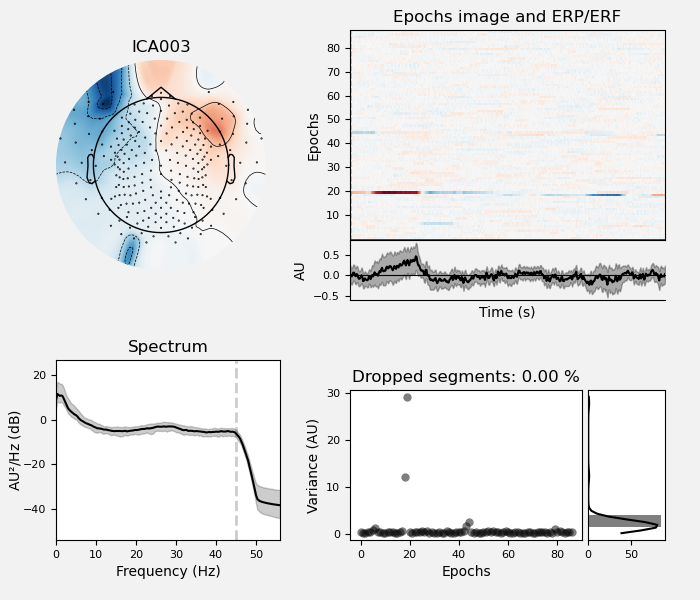

In [12]:
ica.plot_properties(epochs[~reject_log.bad_epochs])

In [ ]:
_ = ica.plot_sources(epochs[~reject_log.bad_epochs], show_scrollbars=False)